In [ ]:
# Install necessary libraries
!apt-get install tesseract-ocr
!pip install pytesseract
!pip install opencv-python
!pip install matplotlib
!pip install scikit-image

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 15 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 1s (5,066 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 120882 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [ ]:
# Import libraries
import cv2
import pytesseract
from PIL import Image
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.filters import threshold_local
from skimage import img_as_ubyte
from skimage.morphology import square, binary_closing
from skimage.filters import threshold_otsu
import numpy as np



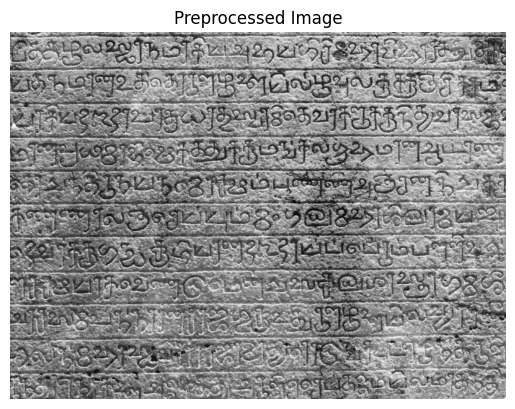

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load and preprocess the image
def preprocess_image(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, None, fx=0.5, fy=0.5)
    img = cv2.convertScaleAbs(img)
    img = cv2.fastNlMeansDenoising(img, None, h=10)
    img = img.astype(np.float32) / 255.0
    img = cv2.convertScaleAbs(img * 255.0)
    return img

# Replace "path/to/your/image.jpg" with the actual path to your stone scripture image
image_path = "abc.jpg"
preprocessed_img = preprocess_image(image_path)

# Display the preprocessed image
plt.imshow(preprocessed_img, cmap='gray')
plt.axis('off')
plt.title('Preprocessed Image')
plt.show()


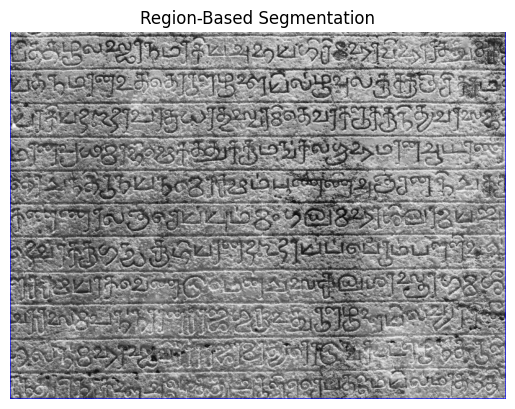

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function for region-based segmentation using watershed algorithm
def region_based_segmentation(img):
    # Threshold the image to obtain a binary image
    _, thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Perform morphological operations to clean up the image
    kernel = np.ones((3, 3), np.uint8)
    opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)

    # Perform a distance transform
    dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)

    # Normalize the distance transform to range 0-255
    _, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)

    # Convert sure_fg to uint8 type
    sure_fg = np.uint8(sure_fg)

    # Find unknown region
    sure_bg = cv2.dilate(opening, kernel, iterations=3)
    sure_bg = 255 - sure_bg

    # Mark the unknown region in sure_bg
    sure_fg = cv2.subtract(sure_fg, sure_bg)

    # Label the markers for watershed algorithm
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[sure_bg == 255] = 0

    # Apply watershed algorithm
    img_copy = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    cv2.watershed(img_copy, markers)

    # Highlight the segmented regions on the original image
    img_copy[markers == -1] = [0, 0, 255]  # Mark watershed boundaries in red

    return img_copy

# Apply region-based segmentation to the preprocessed image
segmented_img_region = region_based_segmentation(preprocessed_img)

# Display the result of region-based segmentation
plt.imshow(segmented_img_region)
plt.axis('off')
plt.title('Region-Based Segmentation')
plt.show()


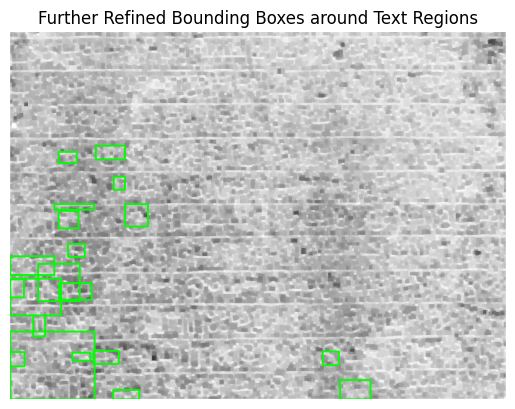

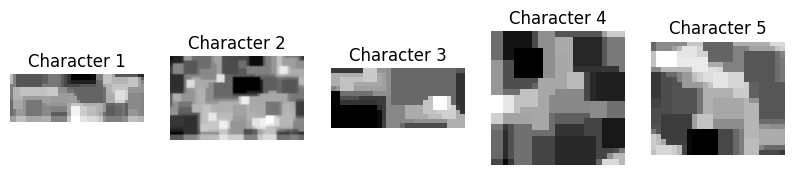

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Convert the segmented image to grayscale
    eroded_edges_gray = cv2.cvtColor(eroded_edges, cv2.COLOR_BGR2GRAY)

    # Apply adaptive thresholding to enhance text visibility
    _, adaptive_thresh = cv2.threshold(eroded_edges_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(eroded_edges_gray, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [eroded_edges_gray[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(segmented_img_region)


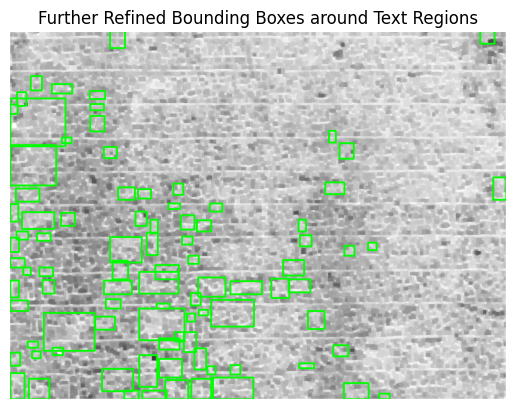

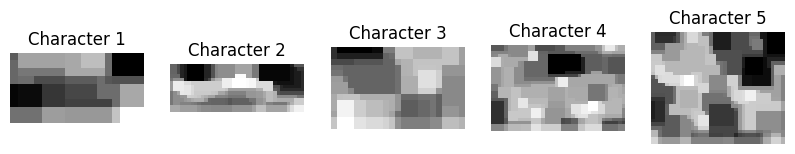

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Convert the segmented image to grayscale
    eroded_edges_gray = cv2.cvtColor(eroded_edges, cv2.COLOR_BGR2GRAY)

    # Apply adaptive thresholding to enhance text visibility
    _, adaptive_thresh = cv2.threshold(eroded_edges_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(eroded_edges_gray, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [eroded_edges_gray[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(segmented_img_region)


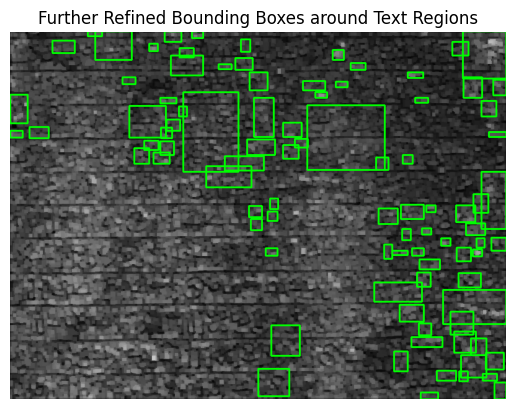

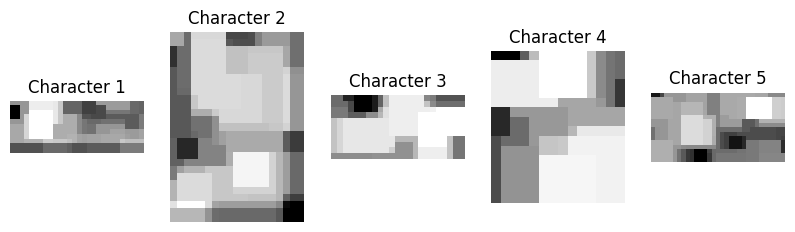

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Convert the segmented image to grayscale
    eroded_edges_gray = cv2.cvtColor(eroded_edges, cv2.COLOR_BGR2GRAY)

    # Invert the image to focus on dark text
    inverted_img = cv2.bitwise_not(eroded_edges_gray)

    # Apply adaptive thresholding to enhance text visibility
    _, adaptive_thresh = cv2.threshold(inverted_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(inverted_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [inverted_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(segmented_img_region)


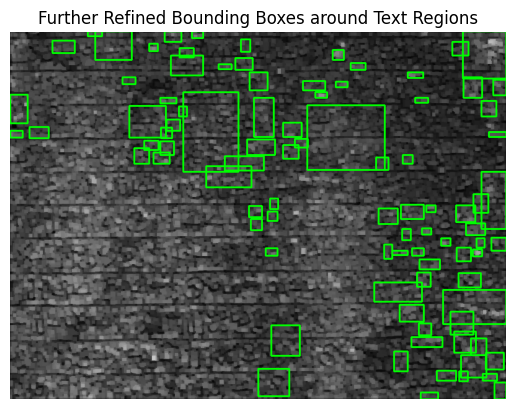

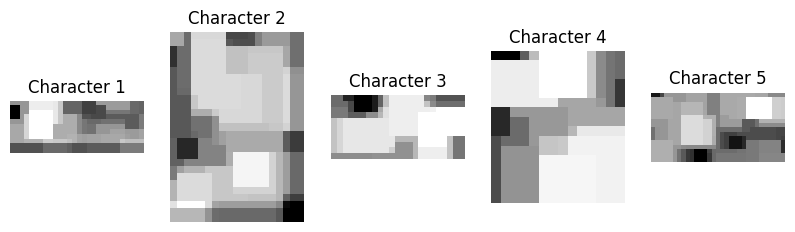

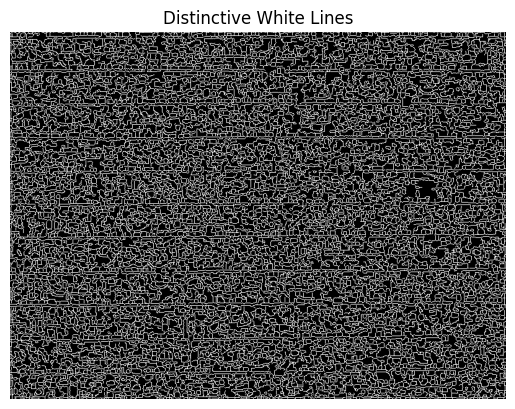

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Convert the segmented image to grayscale
    eroded_edges_gray = cv2.cvtColor(eroded_edges, cv2.COLOR_BGR2GRAY)

    # Invert the image to focus on dark text
    inverted_img = cv2.bitwise_not(eroded_edges_gray)

    # Apply adaptive thresholding to enhance text visibility
    _, adaptive_thresh = cv2.threshold(inverted_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(inverted_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [inverted_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

    # Detect and extract distinctive white lines using edge detection
    white_lines = detect_white_lines(inverted_img)

    plt.imshow(white_lines, cmap='gray')
    plt.axis('off')
    plt.title('Distinctive White Lines')
    plt.show()

def detect_white_lines(img):
    # Apply Canny edge detection
    edges = cv2.Canny(img, 30, 100)

    return edges

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(segmented_img_region)


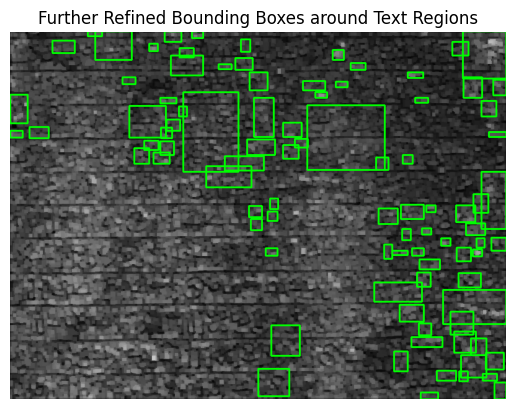

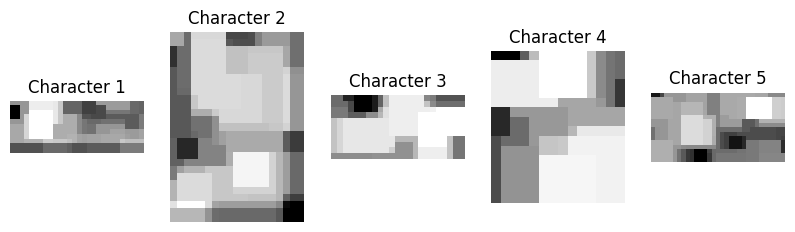

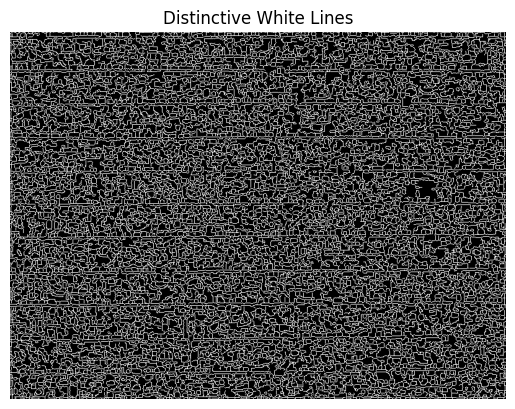

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Convert the segmented image to grayscale
    eroded_edges_gray = cv2.cvtColor(eroded_edges, cv2.COLOR_BGR2GRAY)

    # Invert the image to focus on dark text
    inverted_img = cv2.bitwise_not(eroded_edges_gray)

    # Apply adaptive thresholding to enhance text visibility
    _, adaptive_thresh = cv2.threshold(inverted_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(inverted_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [inverted_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

    # Detect and extract distinctive white lines using edge detection
    white_lines = detect_white_lines(inverted_img)

    plt.imshow(white_lines, cmap='gray')
    plt.axis('off')
    plt.title('Distinctive White Lines')
    plt.show()

def detect_white_lines(img):
    # Apply Canny edge detection
    edges = cv2.Canny(img, 30, 100)

    return edges

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(segmented_img_region)


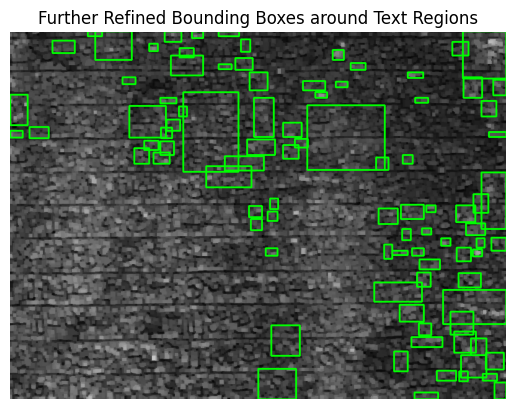

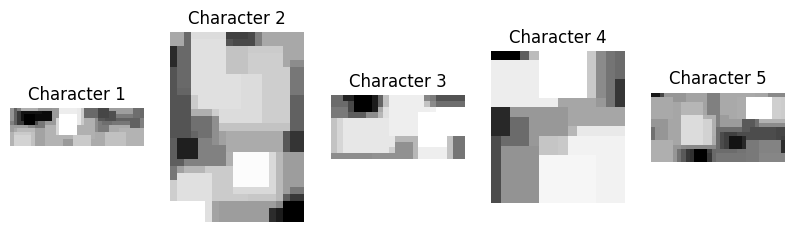

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Invert the eroded edges to enhance dark lines
    inverted_image = cv2.bitwise_not(eroded_edges)

    # Apply adaptive thresholding to enhance text visibility
    _, adaptive_thresh = cv2.threshold(inverted_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(inverted_image, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [inverted_image[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


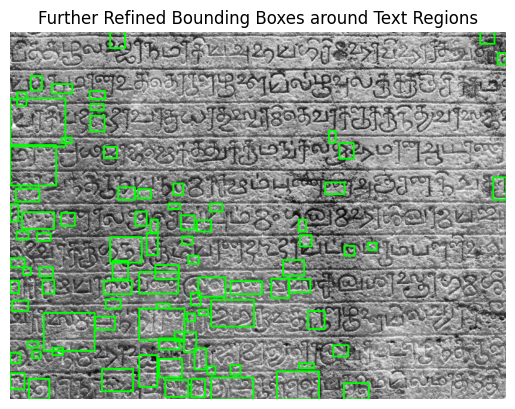

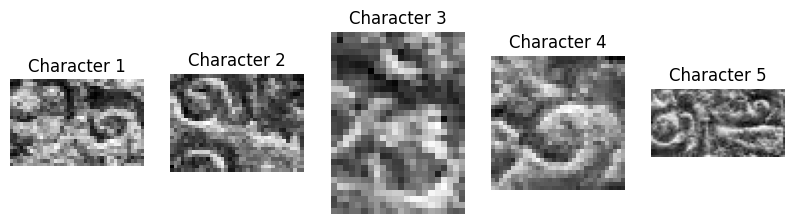

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility
    _, adaptive_thresh = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


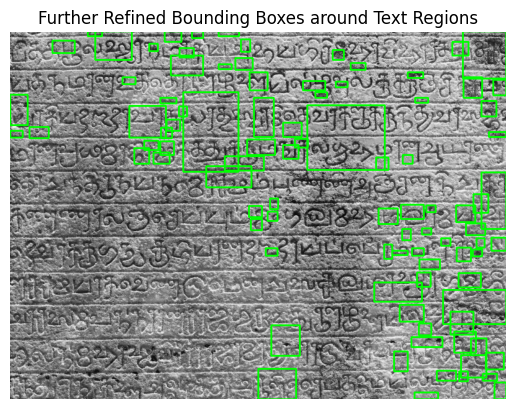

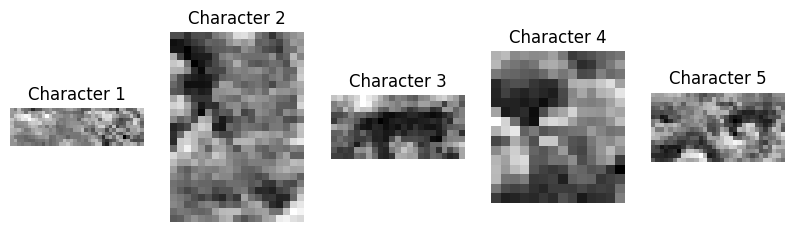

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


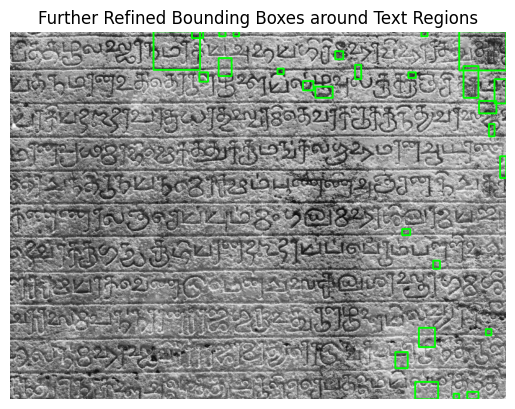

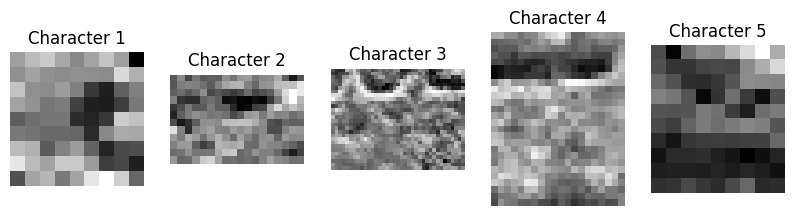

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((5, 5), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=3)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 50
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


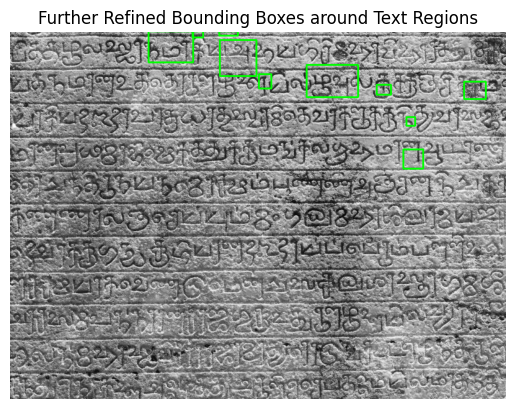

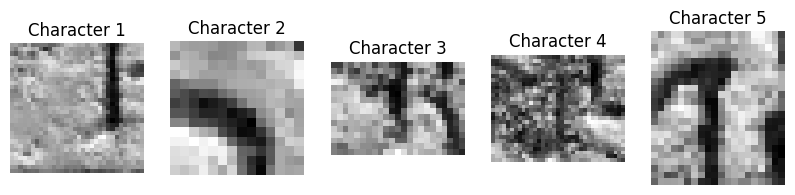

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=4)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((7, 7), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=3)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 100
    max_contour_area = 5000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


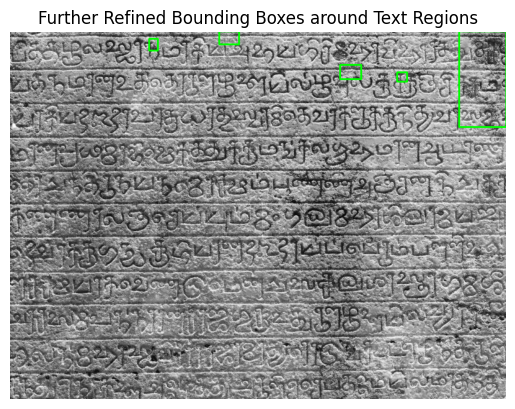

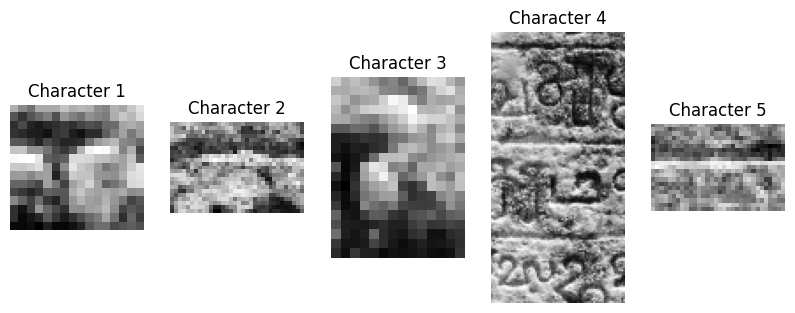

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((7, 7), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=3)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 10
    max_contour_area = 10000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(5, len(contrast_stretched_characters))):
        plt.subplot(1, 5, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


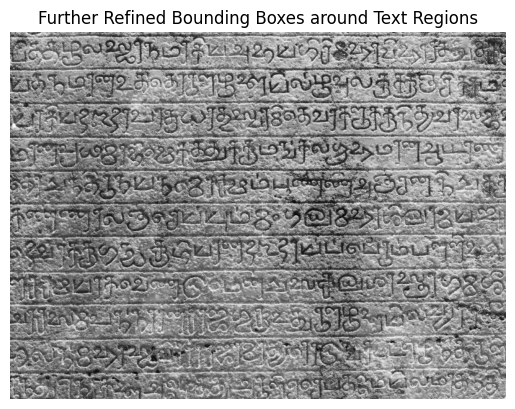

<Figure size 1000x500 with 0 Axes>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 5000
    max_contour_area = 8150


    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(10, len(contrast_stretched_characters))):
        plt.subplot(1, 10, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


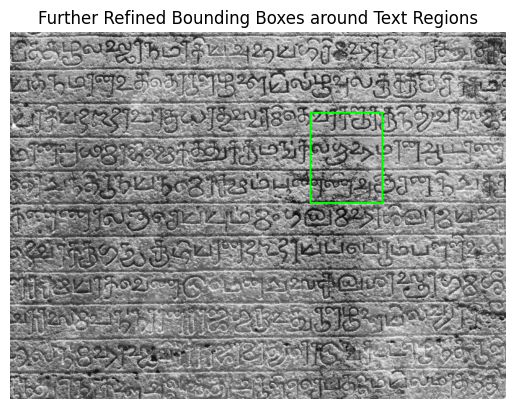

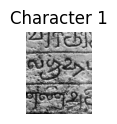

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=5)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=4)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area = 6000
    max_contour_area = 8150


    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(10, len(contrast_stretched_characters))):
        plt.subplot(1, 10, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


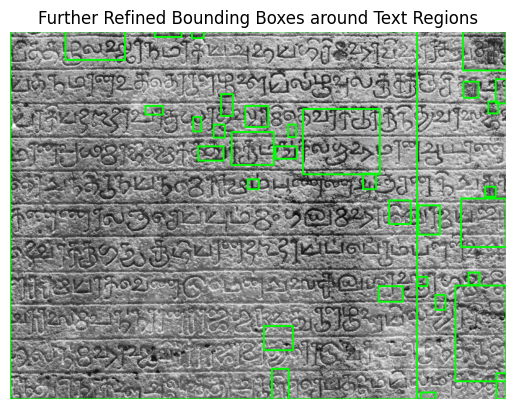

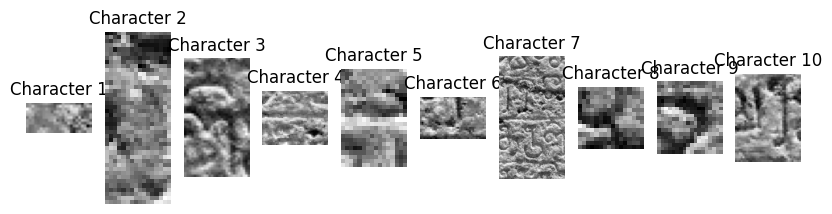

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Further enhanced function for character extraction with refined contours
def extract_characters_further_enhanced_segmented(segmented_img):
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=4)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=3)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((5, 5), np.uint8)  # Adjust kernel size
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=3)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=3)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Further Refined Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    # Enhance the visibility of characters using contrast stretching
    contrast_stretched_characters = [cv2.normalize(char, None, 0, 255, cv2.NORM_MINMAX) for char in characters]

    plt.figure(figsize=(10, 5))
    for i in range(min(10, len(contrast_stretched_characters))):
        plt.subplot(1, 10, i + 1)
        plt.imshow(contrast_stretched_characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with further enhanced contours and refined bounding boxes
extract_characters_further_enhanced_segmented(preprocessed_img)


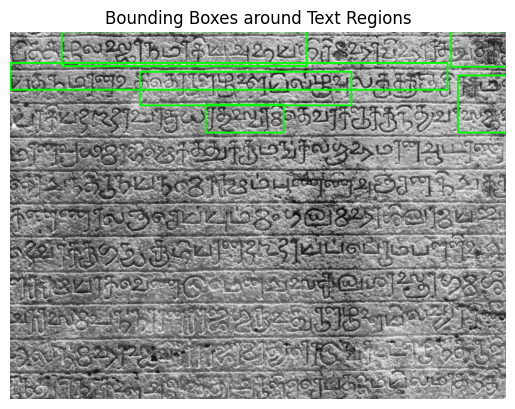

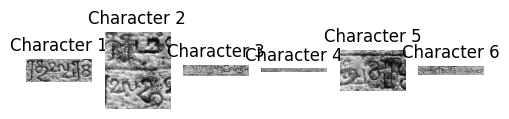

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_characters(segmented_img):
    # Apply adaptive thresholding
    _, adaptive_thresh = cv2.threshold(segmented_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=0)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=0)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of the image
    min_contour_area = 1900
    max_contour_area = 10000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Bounding Boxes around Text Regions')
    plt.show()

    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes]

    plt.figure(figsize=(15, 5))
    for i in range(min(15, len(characters))):
        plt.subplot(1, 15, i + 1)
        plt.imshow(characters[i], cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Extract characters with refined contours and bounding boxes
extract_characters(preprocessed_img)



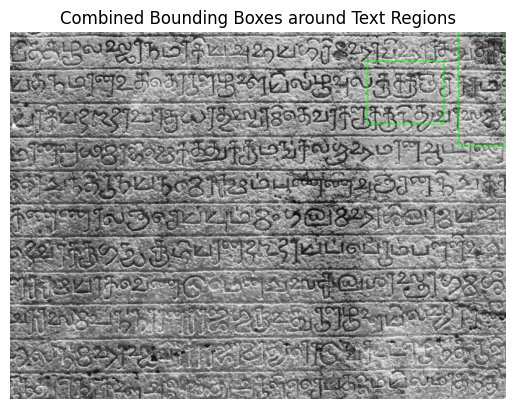

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def extract_characters_combined(segmented_img):
    # Apply adaptive thresholding
    _, adaptive_thresh = cv2.threshold(segmented_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of the image
    min_contour_area = 1900
    max_contour_area = 10000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    # Result image with bounding boxes
    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Additional enhancement with refined contours
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh_refined = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    cleaned_image_refined = cv2.morphologyEx(adaptive_thresh_refined, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image_refined = cv2.morphologyEx(cleaned_image_refined, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image with refined contours
    contours_refined, _ = cv2.findContours(cleaned_image_refined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area_refined = 5000
    max_contour_area_refined = 8150

    # Filter contours based on area for refined contours
    filtered_contours_refined = [cnt for cnt in contours_refined if min_contour_area_refined < cv2.contourArea(cnt) < max_contour_area_refined]

    # Result image with further refined bounding boxes
    result_img_refined = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes_refined = [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]

    for x, y, w, h in bounding_boxes_refined:
        cv2.rectangle(result_img_refined, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Combine both sets of bounding boxes on a single image
    combined_result_img = cv2.addWeighted(result_img, 0.5, result_img_refined, 0.5, 0)

    # Display the combined result image
    plt.imshow(combined_result_img)
    plt.axis('off')
    plt.title('Combined Bounding Boxes around Text Regions')
    plt.show()

# Extract characters with refined contours and bounding boxes
extract_characters_combined(preprocessed_img)


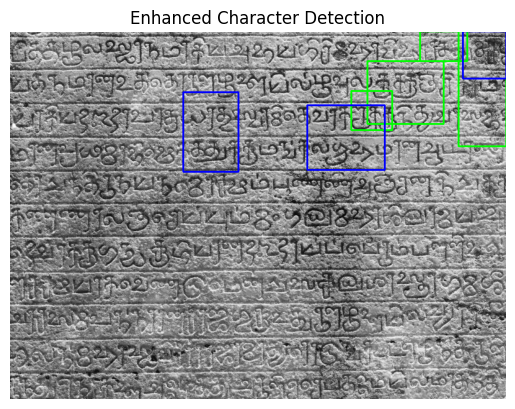

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def enhance_character_detection(segmented_img):
    # Apply adaptive thresholding
    _, adaptive_thresh = cv2.threshold(segmented_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of the image
    min_contour_area = 1000
    max_contour_area = 10000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    # Result image with bounding boxes
    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Additional enhancement with refined contours
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh_refined = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image with refined contours
    cleaned_image_refined = cv2.morphologyEx(adaptive_thresh_refined, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image_refined = cv2.morphologyEx(cleaned_image_refined, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image with refined contours
    contours_refined, _ = cv2.findContours(cleaned_image_refined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area_refined = 2000
    max_contour_area_refined = 20000

    # Filter contours based on area for refined contours
    filtered_contours_refined = [cnt for cnt in contours_refined if min_contour_area_refined < cv2.contourArea(cnt) < max_contour_area_refined]

    # Draw refined bounding boxes on the result image
    for x, y, w, h in [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Display the result image
    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Enhanced Character Detection')
    plt.show()

# Apply the enhanced character detection to your image
enhance_character_detection(preprocessed_img)



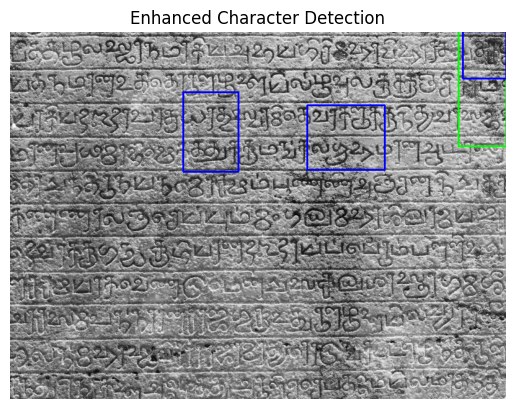

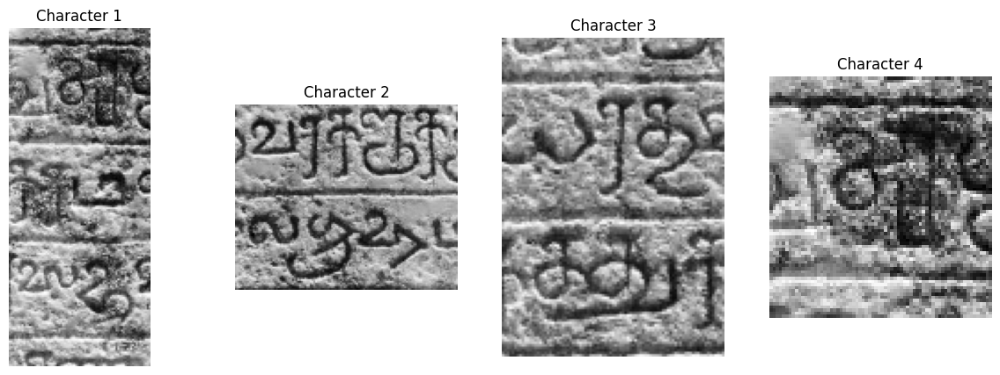

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def enhance_character_detection(segmented_img):
    # Apply adaptive thresholding
    _, adaptive_thresh = cv2.threshold(segmented_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of the image
    min_contour_area = 5000
    max_contour_area = 10000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    # Result image with bounding boxes
    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Additional enhancement with refined contours
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh_refined = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image with refined contours
    cleaned_image_refined = cv2.morphologyEx(adaptive_thresh_refined, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image_refined = cv2.morphologyEx(cleaned_image_refined, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image with refined contours
    contours_refined, _ = cv2.findContours(cleaned_image_refined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area_refined = 2000
    max_contour_area_refined = 20000

    # Filter contours based on area for refined contours
    filtered_contours_refined = [cnt for cnt in contours_refined if min_contour_area_refined < cv2.contourArea(cnt) < max_contour_area_refined]

    # Draw refined bounding boxes on the result image
    for x, y, w, h in [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Display the result image
    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Enhanced Character Detection')
    plt.show()

    # Extracted characters from both sets of bounding boxes
    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes + [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]]

    # Display the extracted characters
    plt.figure(figsize=(15, 5))
    for i, char in enumerate(characters):
        plt.subplot(1, len(characters), i + 1)
        plt.imshow(char, cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Apply the enhanced character detection to your image
enhance_character_detection(preprocessed_img)


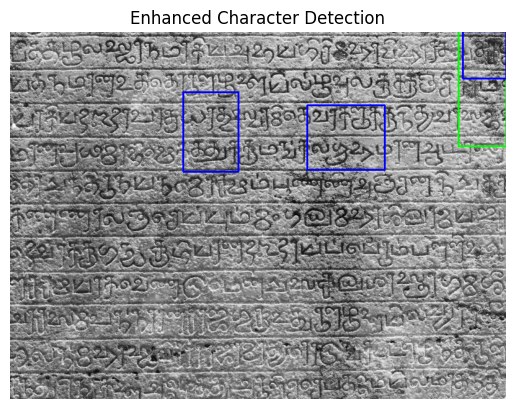

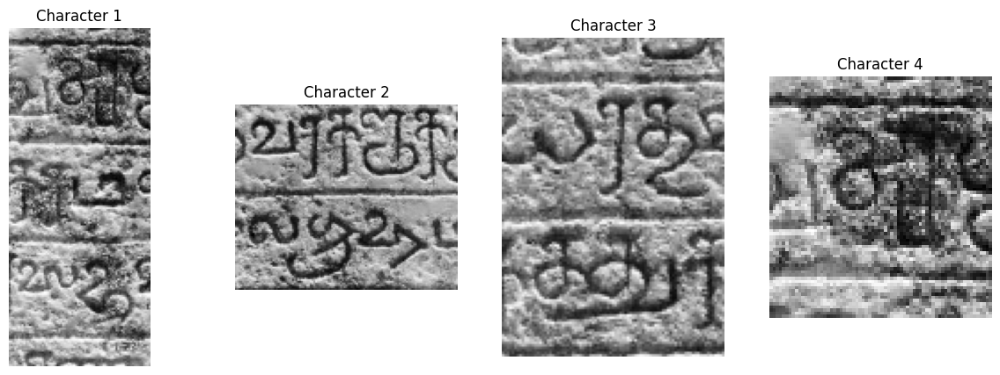

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def enhance_character_detection(segmented_img):
    # Apply adaptive thresholding
    _, adaptive_thresh = cv2.threshold(segmented_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of the image
    min_contour_area = 5000
    max_contour_area = 10000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    # Result image with bounding boxes
    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Additional enhancement with refined contours
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh_refined = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image with refined contours
    cleaned_image_refined = cv2.morphologyEx(adaptive_thresh_refined, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image_refined = cv2.morphologyEx(cleaned_image_refined, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image with refined contours
    contours_refined, _ = cv2.findContours(cleaned_image_refined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area_refined = 2000
    max_contour_area_refined = 20000

    # Filter contours based on area for refined contours
    filtered_contours_refined = [cnt for cnt in contours_refined if min_contour_area_refined < cv2.contourArea(cnt) < max_contour_area_refined]

    # Filter out small dark artifacts based on intensity threshold
    intensity_threshold = 110
    filtered_contours_refined = [cnt for cnt in filtered_contours_refined if np.mean(segmented_img[y:y+h, x:x+w]) > intensity_threshold]

    # Draw refined bounding boxes on the result image
    for x, y, w, h in [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Display the result image
    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Enhanced Character Detection')
    plt.show()

    # Extracted characters from both sets of bounding boxes
    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes + [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]]

    # Display the extracted characters
    plt.figure(figsize=(15, 5))
    for i, char in enumerate(characters):
        plt.subplot(1, len(characters), i + 1)
        plt.imshow(char, cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Apply the enhanced character detection to your image
enhance_character_detection(preprocessed_img)


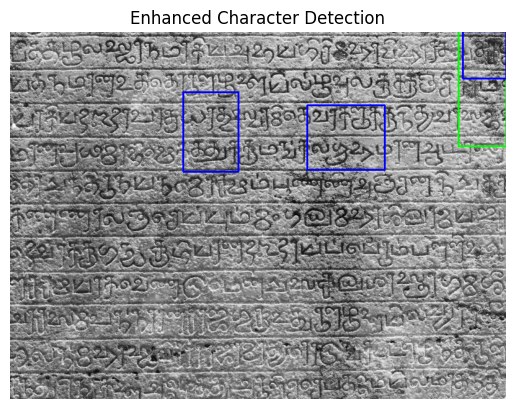

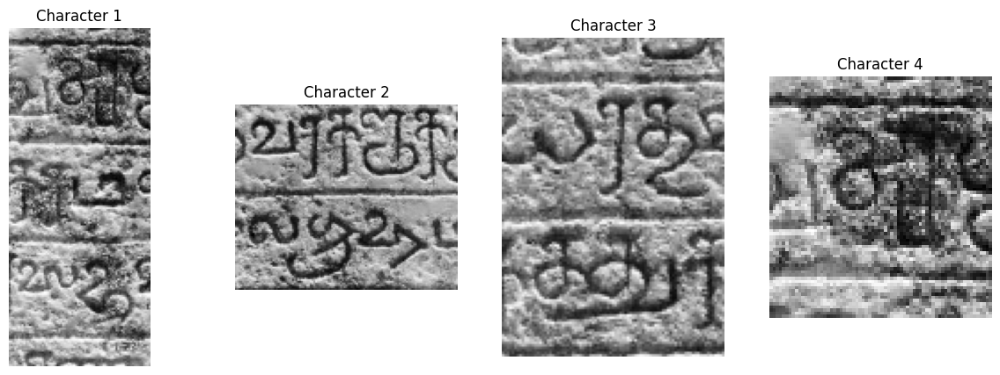

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def enhance_character_detection(segmented_img):
    # Apply adaptive thresholding
    _, adaptive_thresh = cv2.threshold(segmented_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of the image
    min_contour_area = 5000
    max_contour_area = 10000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    # Result image with bounding boxes
    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Additional enhancement with refined contours
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=3)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=2)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh_refined = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image with refined contours
    cleaned_image_refined = cv2.morphologyEx(adaptive_thresh_refined, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image_refined = cv2.morphologyEx(cleaned_image_refined, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image with refined contours
    contours_refined, _ = cv2.findContours(cleaned_image_refined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area_refined = 2000
    max_contour_area_refined = 20000

    # Filter contours based on area for refined contours
    filtered_contours_refined = [cnt for cnt in contours_refined if min_contour_area_refined < cv2.contourArea(cnt) < max_contour_area_refined]

    # Filter out small dark artifacts based on intensity threshold
    intensity_threshold = 50
    filtered_contours_refined = [cnt for cnt in filtered_contours_refined if np.mean(segmented_img[y:y+h, x:x+w]) > intensity_threshold]

    # Draw refined bounding boxes on the result image
    for x, y, w, h in [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 0, 255), 2)

    # Display the result image
    plt.imshow(result_img)
    plt.axis('off')
    plt.title('Enhanced Character Detection')
    plt.show()

    # Extracted characters from both sets of bounding boxes
    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes + [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]]

    # Display the extracted characters
    plt.figure(figsize=(15, 5))
    for i, char in enumerate(characters):
        plt.subplot(1, len(characters), i + 1)
        plt.imshow(char, cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Apply the enhanced character detection to your image
enhance_character_detection(preprocessed_img)


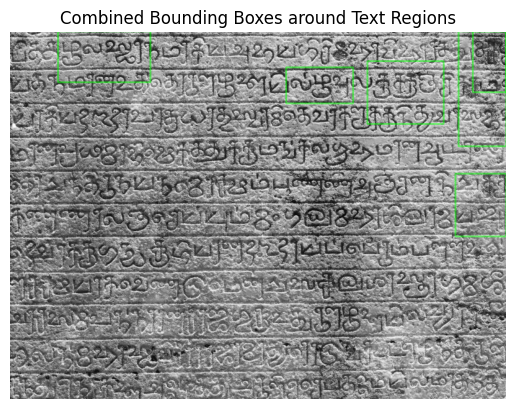

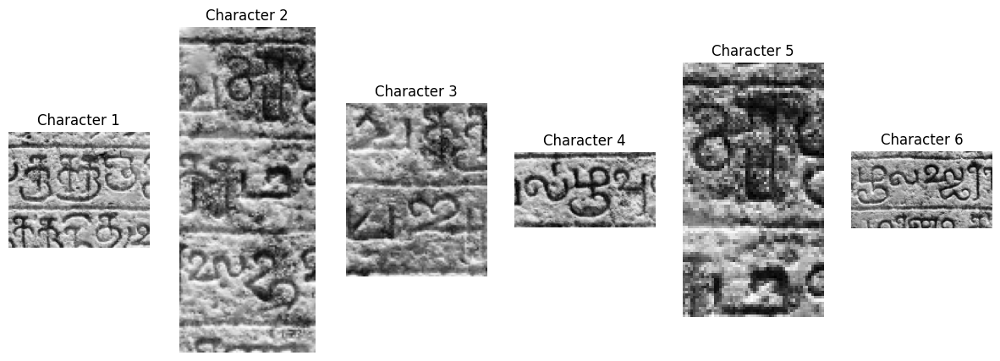

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure

def enhance_character_detection(segmented_img):
    # Apply adaptive thresholding
    _, adaptive_thresh = cv2.threshold(segmented_img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    kernel = np.ones((3, 3), np.uint8)
    cleaned_image = cv2.morphologyEx(adaptive_thresh, cv2.MORPH_CLOSE, kernel, iterations=2)
    cleaned_image = cv2.morphologyEx(cleaned_image, cv2.MORPH_OPEN, kernel, iterations=2)

    # Find contours on the cleaned image
    contours, _ = cv2.findContours(cleaned_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of the image
    min_contour_area = 3000
    max_contour_area = 20000

    # Filter contours based on area
    filtered_contours = [cnt for cnt in contours if min_contour_area < cv2.contourArea(cnt) < max_contour_area]

    # Result image with bounding boxes
    result_img = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes = [cv2.boundingRect(cnt) for cnt in filtered_contours]

    for x, y, w, h in bounding_boxes:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Additional enhancement with refined contours
    # Increase dilation and add a bit of erosion to make contours more prominent
    dilated_edges = cv2.dilate(segmented_img, None, iterations=1)
    eroded_edges = cv2.erode(dilated_edges, None, iterations=1)

    # Apply adaptive thresholding to enhance text visibility (invert the image)
    _, adaptive_thresh_refined = cv2.threshold(eroded_edges, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Further morphological operations for cleaning up the image
    cleaned_image_refined = cv2.morphologyEx(adaptive_thresh_refined, cv2.MORPH_CLOSE, kernel, iterations=3)
    cleaned_image_refined = cv2.morphologyEx(cleaned_image_refined, cv2.MORPH_OPEN, kernel, iterations=3)

    # Find contours on the cleaned image with refined contours
    contours_refined, _ = cv2.findContours(cleaned_image_refined, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Adjust contour area thresholds based on the characteristics of region-based segmentation
    min_contour_area_refined = 2000
    max_contour_area_refined = 20000

    # Filter contours based on area for refined contours
    filtered_contours_refined = [cnt for cnt in contours_refined if min_contour_area_refined < cv2.contourArea(cnt) < max_contour_area_refined]

    # Result image with further refined bounding boxes
    result_img_refined = cv2.cvtColor(segmented_img, cv2.COLOR_GRAY2BGR)

    bounding_boxes_refined = [cv2.boundingRect(cnt) for cnt in filtered_contours_refined]

    for x, y, w, h in bounding_boxes_refined:
        cv2.rectangle(result_img_refined, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Filter out small dark artifacts based on intensity threshold
    intensity_threshold = 110
    filtered_contours_refined = [cnt for cnt in filtered_contours_refined if np.mean(segmented_img[y:y+h, x:x+w]) > intensity_threshold]

    # Draw refined bounding boxes on the result image
    for x, y, w, h in bounding_boxes_refined:
        cv2.rectangle(result_img_refined, (x, y), (x+w, y+h), (0, 255, 0), 2)

    # Combine both sets of bounding boxes on a single image
    combined_result_img = cv2.addWeighted(result_img, 0.5, result_img_refined, 0.5, 0)

    # Display the combined result image
    plt.imshow(combined_result_img)
    plt.axis('off')
    plt.title('Combined Bounding Boxes around Text Regions')
    plt.show()

    # Extracted characters from both sets of bounding boxes
    characters = [segmented_img[y:y+h, x:x+w] for x, y, w, h in bounding_boxes + bounding_boxes_refined]

    # Display the extracted characters
    plt.figure(figsize=(15, 5))
    for i, char in enumerate(characters):
        plt.subplot(1, len(characters), i + 1)
        plt.imshow(char, cmap='gray')
        plt.axis('off')
        plt.title(f'Character {i + 1}')
    plt.show()

# Apply the enhanced character detection to your image
enhance_character_detection(preprocessed_img)
